In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from pathlib import Path

In [2]:
def load_df(load_gender=False, exclude_gcn=True, exclude_pca_all=True):
    random_states = [1,2,3,5,8,13,21,34,55,89]
    fractions = [0.2, 0.4, 0.6, 0.8, 1.0]
    sessions = [0.25, 0.5, 1, 2, 4]
    file_format = "cv_scores_rs-{}_fraction-{}_sessions-{}.csv"
    # file_format_coupled = "cv_scores_rs-{}_fraction-{}_sessions-{}_coupled-decoupled-fc.csv"
    # file_format_fc = "cv_scores_rs-{}_fraction-{}_sessions-{}_fc.csv"
    file_format_gcn = "cv_scores_rs-{}_fraction-{}_sessions-{}_gcn.csv"
    file_format_gender = "cv_scores_rs-{}_fraction-{}_sessions-{}_gender.csv"
    file_format_gender_gcn = "cv_scores_rs-{}_fraction-{}_sessions-{}_gender_gcn.csv"
    folder = "/home/localadmin/hcp-behavior-prediction/outputs/scaling"
    if load_gender:
        file_formats = [file_format_gender]
        if exclude_gcn:
            file_formats.append(file_format_gcn)
    else:
        file_formats = [file_format]
        if exclude_gcn:
            file_formats.append(file_format_gender_gcn)
    tables = []
    for rs in random_states:
        for fraction in fractions:
            for session in sessions:
                for fformat in file_formats:
                    file_name = fformat.format(rs, fraction, session)
                    path = Path(folder, file_name)
                    try:
                        df = pd.read_csv(path, index_col=0)
                        if exclude_gcn and "gcn" not in file_name:
                            df = df[~df["feature"].str.contains("gcn", case=False)]
                        if exclude_pca_all:
                            df = df[~df["feature"].str.contains("pca_all", case=False)]
                        # exclude hurst and 1dconv
                        df = df[~df["feature"].str.contains("hurst", case=False)]
                        df = df[~df["feature"].str.contains("1dconv", case=False)]
                        tables.append(df)
                    except FileNotFoundError:
                        print(f"{file_name} - not found")
                        continue
    df = pd.concat(tables)
    return df

df = load_df()
df_gender = load_df(load_gender=True)

cv_scores_rs-1_fraction-0.2_sessions-0.25_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.2_sessions-0.5_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.2_sessions-1_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.2_sessions-2_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.2_sessions-4_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.4_sessions-0.25_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.4_sessions-0.5_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.4_sessions-1_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.4_sessions-2_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.4_sessions-4_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.6_sessions-0.25_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.6_sessions-0.5_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.6_sessions-1_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.6_sessions-2_gender_gcn.csv - not found
cv_scores_rs-1_fraction-0.6_sessions-4_gender_gcn.csv - not f

In [3]:
df.feature.unique()

array(['mean', 'std', 'variability', 'fALFF', 'SDI', 'PSD', 'fc_coupled',
       'fc_decoupled', 'FC_pca', 'FC_KR'], dtype=object)

In [4]:
df_gender

,name,feature,target,random_state,fraction,sessions,accuracy
0,feature-mean_target-gender_rs-1_fraction-0.2_s...,mean,gender,1,0.2,0.25,0.600000
1,feature-std_target-gender_rs-1_fraction-0.2_se...,std,gender,1,0.2,0.25,0.730769
2,feature-variability_target-gender_rs-1_fractio...,variability,gender,1,0.2,0.25,0.753846
3,feature-fALFF_target-gender_rs-1_fraction-0.2_...,fALFF,gender,1,0.2,0.25,0.646154
5,feature-SDI_target-gender_rs-1_fraction-0.2_se...,SDI,gender,1,0.2,0.25,0.676923
...,...,...,...,...,...,...,...
6,feature-PSD_target-gender_rs-89_fraction-1.0_s...,PSD,gender,89,1.0,4.00,0.833333
12,feature-fc_coupled_target-gender_rs-89_fractio...,fc_coupled,gender,89,1.0,4.00,0.920635
13,feature-fc_decoupled_target-gender_rs-89_fract...,fc_decoupled,gender,89,1.0,4.00,0.888889
14,feature-FC_pca_target-gender_rs-89_fraction-1....,FC_pca,gender,89,1.0,4.00,0.888889


In [5]:
df_mean = df.groupby(["feature", "target", "fraction", "sessions"]).mean().sort_values(by="test_r2", ascending=False)
# df_mean.iloc[:60]

In [6]:
# df.sort_values(by="test_r2", ascending=False, inplace=False).iloc[:50]

In [7]:
# for target in df["target"].unique():
#     fig, axs = plt.subplots(1, 2, figsize=(9, 3), dpi=300, layout="constrained")
#     sns.lineplot(data=df[(df["target"]==target) & (df["feature"]=="std")], x="fraction", y="test_r2", hue="sessions", ax=axs[0])
#     sns.lineplot(data=df[(df["target"]==target) & (df["feature"]=="std")], x="sessions", y="test_r2", hue="fraction", ax=axs[1])
#     fig.suptitle(f"{target} - Standard Deviation")

In [8]:
df["feature"].unique()

array(['mean', 'std', 'variability', 'fALFF', 'SDI', 'PSD', 'fc_coupled',
       'fc_decoupled', 'FC_pca', 'FC_KR'], dtype=object)

In [9]:
# for target in df["target"].unique():
#     fig, axs = plt.subplots(1, 2, figsize=(9, 3), dpi=300, layout="constrained")
#     sns.lineplot(data=df[(df["target"]==target) & (df["feature"]=="std")], x="fraction", y="test_r2", hue="sessions", ax=axs[0])
#     sns.lineplot(data=df[(df["target"]==target) & (df["feature"]=="std")], x="sessions", y="test_r2", hue="fraction", ax=axs[1])
#     fig.suptitle(f"{target} - Standard Deviation")

In [10]:
df_cognition = df[df["target"] == "cognition"]

In [11]:
# fig, axs = plt.subplots(1, 2, figsize=(9, 3), dpi=300, layout="constrained")
# sns.lineplot(data=df_cognition[df_cognition["feature"]=="std"], x="fraction", y="test_r2", hue="sessions", ax=axs[0])
# sns.lineplot(data=df_cognition[df_cognition["feature"]=="std"], x="sessions", y="test_r2", hue="fraction", ax=axs[1])

In [12]:
df.target.unique()

array(['mental_health', 'cognition', 'processing_speed', 'substance_use',
       'age'], dtype=object)

In [13]:
nice_feature_names = ["Mean",
                      "Standard Deviation", 
                      "BOLD Variability",
                      "fALFF",
                      # "Hurst Exponent",
                      "Structural Decoupling Index",
                      "Power Spectral Density",
                      # "GCN - Convolution Layer - 1dconv",
                      # "GCN - Convolution Layer - Mean",
                      # "GCN - Convolution Layer - Max",
                      # "GCN - Regional R2",
                      # "GCN - Convolution Layer - SD",
                      "Coupled FC",
                      "Decoupled FC",
                      "FC PCA - 274 Components",
                    #   "FC PCA - All Components",
                      "FC - Kernel Ridge",]
rename_dict_features = dict(zip(df.feature.unique(), nice_feature_names))
nice_target_names = ["Mental Health", "Cognition", "Processing Speed", "Substance Use", "Age"]
rename_dict_targets = dict(zip(df.target.unique(), nice_target_names))
df_nice = df.replace(rename_dict_features)
df_nice = df_nice.replace(rename_dict_targets)
df_nice_gender = df_gender.replace(rename_dict_features)
df_nice_gender = df_nice_gender.replace({"gender": "Gender"})


In [14]:
def plot_feature_comparison(df, target, scale_factor=0.6, top_n=None, plot_zero_line=True, save_svg=False, file_ending=""):	
    target_name = target
    if target == "Gender":
        measure = "accuracy"
    else:
        measure = "test_r2"

    fig = plt.figure(figsize=(15*scale_factor, 13*scale_factor), dpi=300, layout="constrained")
    (topfig, bottomfig) = fig.subfigures(2, 1, height_ratios=(3, 2.2))
    top_axs = topfig.subplots(1, 1)
    bottom_axs = bottomfig.subplots(1, 2)

    df_plot = df[(df["target"] == target)]
    order = df_plot[(df_plot["sessions"] == 4.0) & (df_plot["fraction"] == 1.0)].groupby("feature").mean().sort_values(by=measure, ascending=False).index
    if top_n is not None:
        order = order[:top_n]
        df_plot = df_plot[df_plot["feature"].isin(order)]
    # Generate color palette in the same order as 'order'
    palette = sns.color_palette("Spectral", n_colors=len(order))
    color_dict = dict(zip(order, palette))

    # Top plot: box plots with reordered colors
    sns.boxplot(
        data=df_plot[(df_plot["sessions"] == 4.0) & (df_plot["fraction"] == 1.0)], x="feature", y=measure, ax=top_axs,
        order=order,
        palette=color_dict,
        showmeans=True,
        meanline=True,
        meanprops={"color": "black", "linestyle": "--", "alpha": 0.5},
        hue="feature",
        legend=False,
        showfliers=False,
    )
    sns.swarmplot(
        data=df_plot[(df_plot["sessions"] == 4.0) & (df_plot["fraction"] == 1.0)], x="feature", y=measure, ax=top_axs,
        order=order,
        color="black", alpha=0.5,
    )

    # Bottom plots: line plots with same color mapping
    sns.lineplot(
        data=df_plot[df_plot["sessions"] == 4.0],
        x="fraction", y=measure, hue="feature", ax=bottom_axs[0],
        palette=color_dict
    )
    sns.lineplot(
        data=df_plot[df_plot["fraction"] == 1.0],
        x="sessions", y=measure, hue="feature", ax=bottom_axs[1],
        palette=color_dict
    )

    # add zero line to boxplot
    if plot_zero_line:
        top_axs.axhline(0, color="black", linestyle="--", linewidth=0.5)

    # Change axis labels
    top_axs.set_xlabel("Feature")
    if target == "Gender":
        top_axs.set_ylabel("Test Accuracy")
        bottom_axs[0].set_ylabel("Test Accuracy")
        bottom_axs[1].set_ylabel("Test Accuracy")
    else:
        top_axs.set_ylabel("Test R²")
        bottom_axs[0].set_ylabel("Test R²")
        bottom_axs[1].set_ylabel("Test R²")
    bottom_axs[0].set_xlabel("Fraction of Training Subjects")
    bottom_axs[1].set_xlabel("Scanning Sessions")

    # Titles
    top_axs.set_title(f"Feature Comparison - {target_name}")
    bottom_axs[0].set_title("Scaling over Subjects")
    bottom_axs[1].set_title("Scaling over Sessions")

    # Remove duplicate legends from bottom plots
    bottom_axs[0].get_legend().remove()
    bottom_axs[1].get_legend().remove()

    # Create custom legend for the figure and place it outside
    handles = [plt.Line2D([0], [0], marker='o', color=color_dict[feat], markersize=8, linestyle='') for feat in order]
    fig.legend(handles, order, title="Feature", loc='center left', bbox_to_anchor=(1, 0.5))

    # Add A,B,C labels
    top_axs.text(-0.1, 1.1, "A", transform=top_axs.transAxes, fontsize=16, fontweight='bold', va='top')
    bottom_axs[0].text(-0.1, 1.1, "B", transform=bottom_axs[0].transAxes, fontsize=16, fontweight='bold', va='top')
    bottom_axs[1].text(-0.1, 1.1, "C", transform=bottom_axs[1].transAxes, fontsize=16, fontweight='bold', va='top')

    # set xticks for bottom plots manually
    bottom_axs[0].set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
    bottom_axs[1].set_xticks([0.25, 0.5, 1, 2, 4])


    # Rotate x-axis labels for better readability
    top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')
    bottom_axs[0].set_xticklabels([0.2, 0.4, 0.6, 0.8, 1.0], rotation=30, ha='right')
    bottom_axs[1].set_xticklabels([0.25, 0.5, 1, 2, 4], rotation=30, ha='right')

    # add vertical lines for xticks of bottom plots
    for ax in bottom_axs:
        for x in ax.get_xticks():
            ax.axvline(x, color="black", linestyle="--", linewidth=0.5, alpha=0.5)
    
    # save figure
    if save_svg:
        fig.savefig(f"../outputs/plots/scaling_paper/feature_comparison_{target.lower()}{file_ending}.svg", bbox_inches='tight')
    
    plt.show()

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


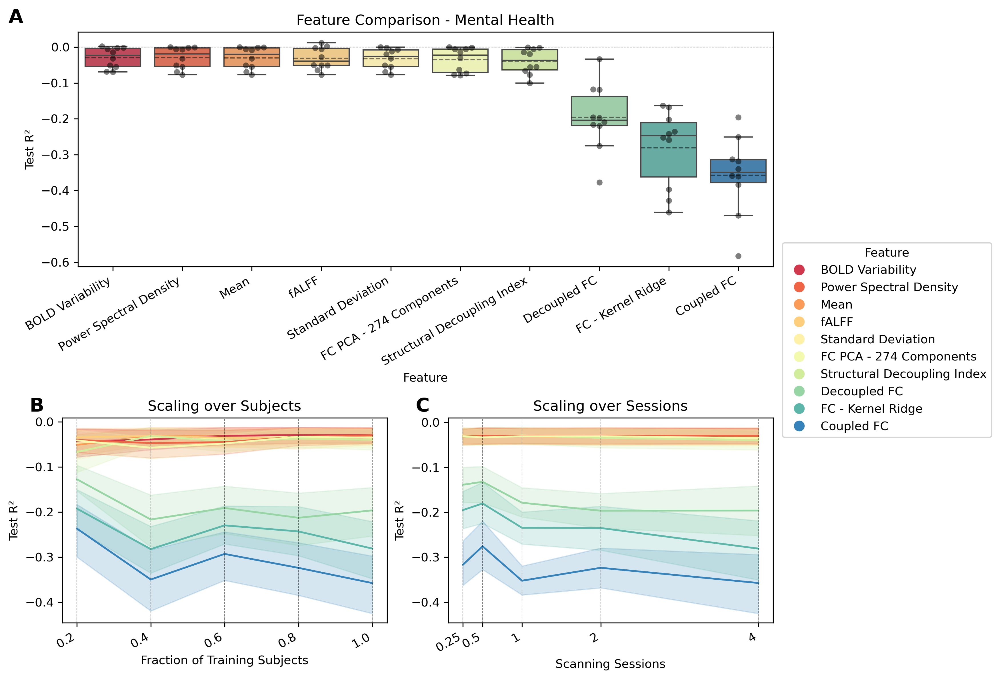

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


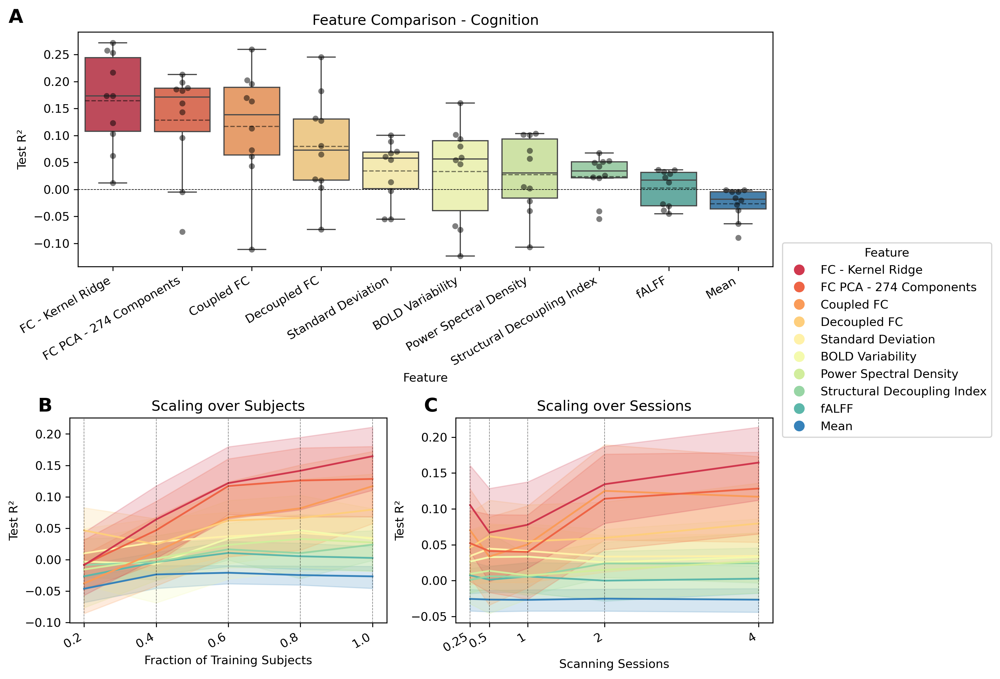

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


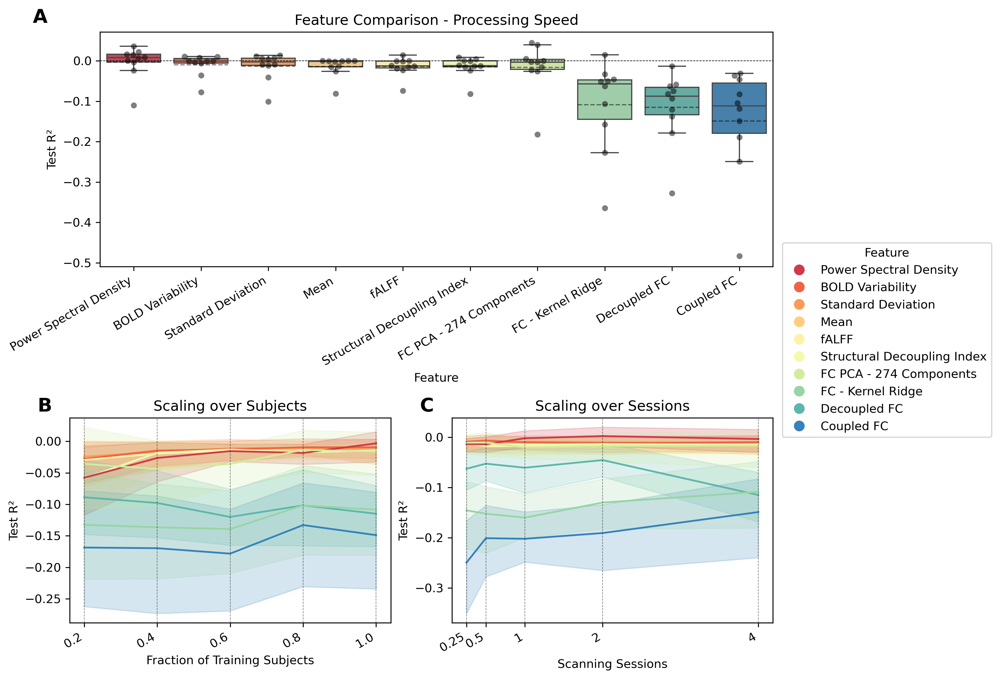

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


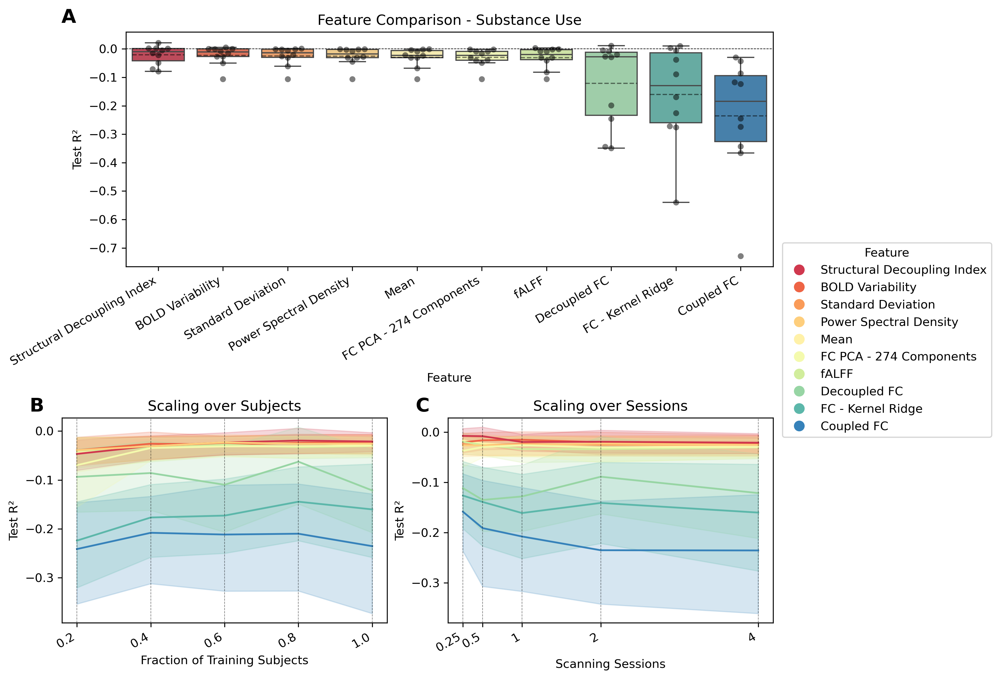

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


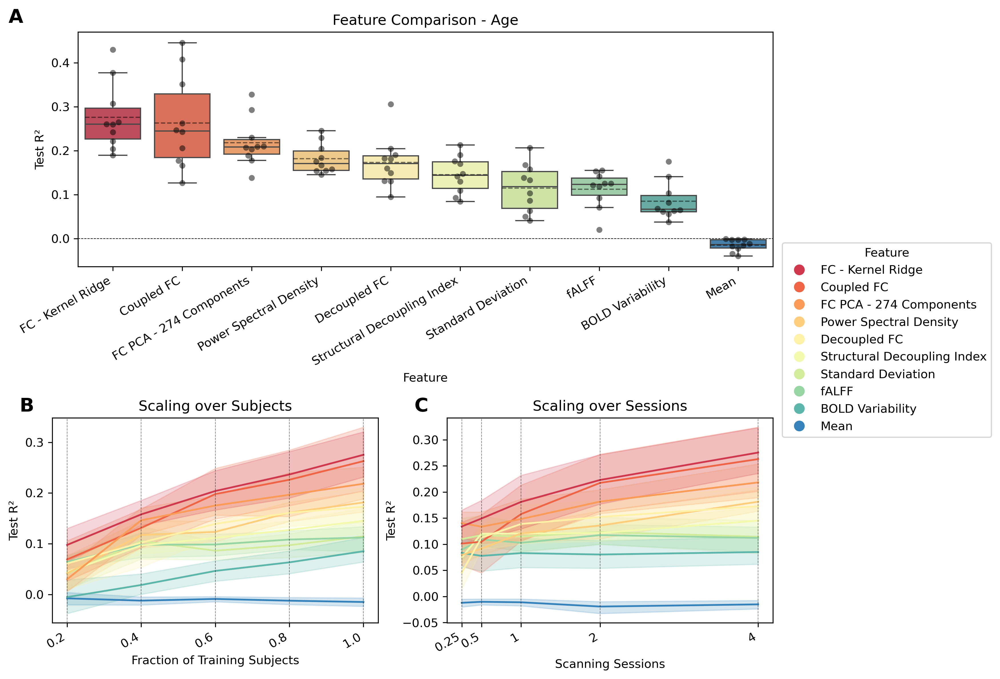

In [15]:
for target in nice_target_names:
    plot_feature_comparison(df_nice, target)

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


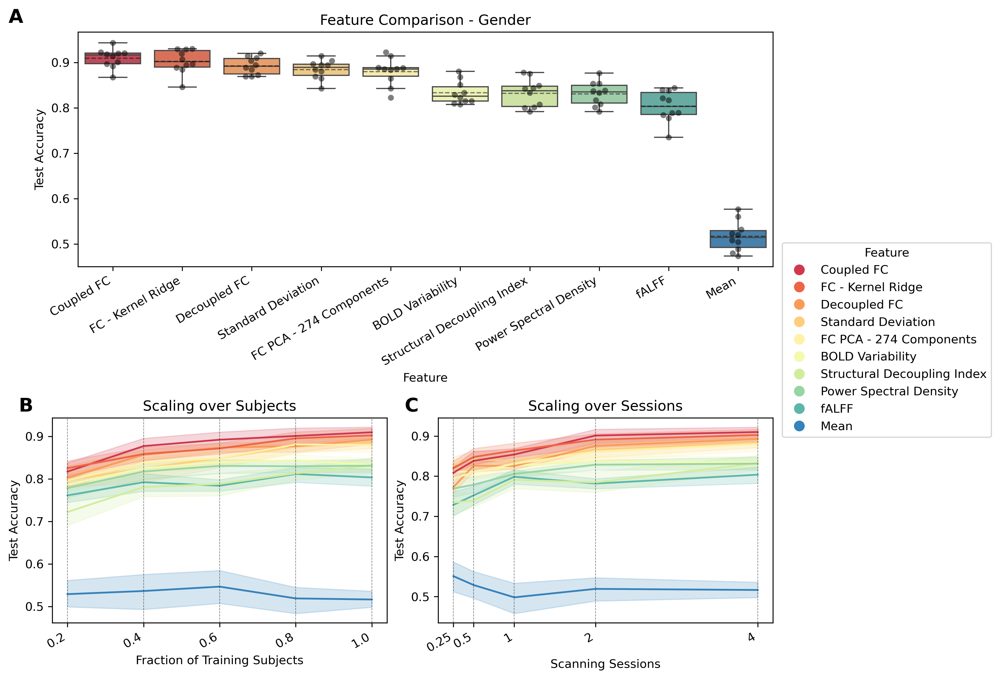

In [16]:
plot_feature_comparison(df_nice_gender, "Gender", plot_zero_line=False)#, save_svg=True)

/tmp/ipykernel_504245/1392630255.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


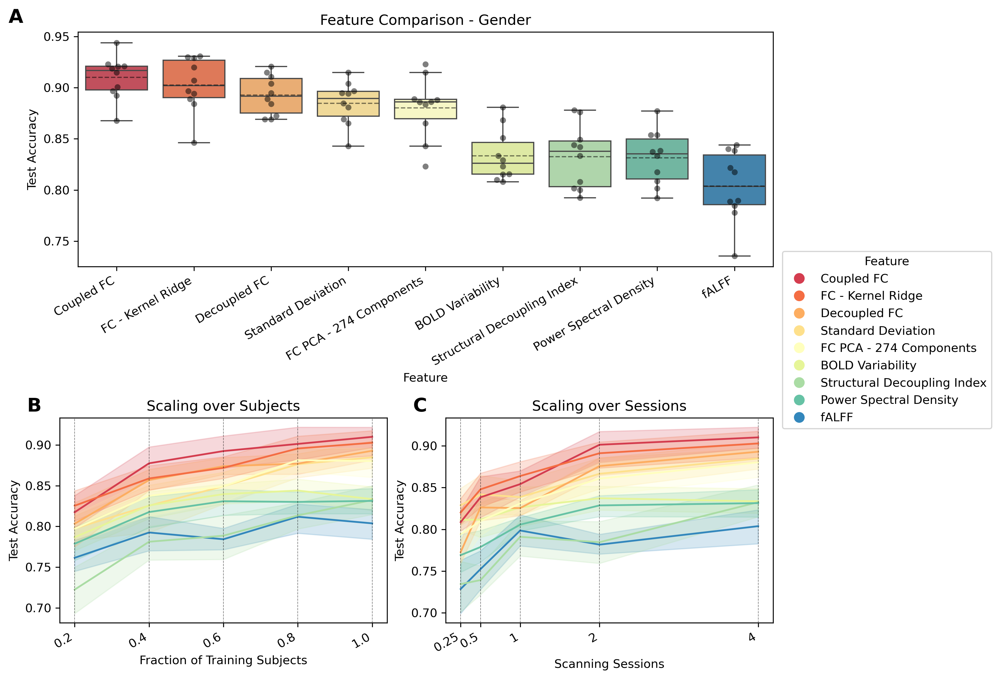

In [25]:
plot_feature_comparison(df_nice_gender, "Gender", top_n=9, plot_zero_line=False)#, save_svg=True, file_ending="_top6")

In [18]:
def plot_target_comparison(df, feature, scale_factor=0.6):
    feature_name = feature
    measure = "test_r2"
    fig = plt.figure(figsize=(15*scale_factor, 12*scale_factor), dpi=300, layout="constrained")
    (topfig, bottomfig) = fig.subfigures(2, 1, height_ratios=(3, 2))
    top_axs = topfig.subplots(1, 1)
    bottom_axs = bottomfig.subplots(1, 2)

    df_plot = df[(df["feature"] == feature)]
    order = df_plot[(df_plot["sessions"] == 4.0) & (df_plot["fraction"] == 1.0)].groupby("target").mean().sort_values(by=measure, ascending=False).index
    # Generate color palette in the same order as 'order'
    palette = sns.color_palette("Spectral", n_colors=len(order))
    color_dict = dict(zip(order, palette))

    # Top plot: box plots with reordered colors
    sns.boxplot(
        data=df_plot[(df_plot["sessions"] == 4.0) & (df_plot["fraction"] == 1.0)], x="target", y=measure, ax=top_axs,
        order=order,
        palette=color_dict,
        showmeans=True,
        meanline=True,
        meanprops={"color": "black", "linestyle": "--", "alpha": 0.5},
        hue="target",
        legend=False,
        showfliers=False,
    )
    sns.swarmplot(
        data=df_plot[(df_plot["sessions"] == 4.0) & (df_plot["fraction"] == 1.0)], x="target", y=measure, ax=top_axs,
        order=order,
        color="black", alpha=0.5,
    )

    # Bottom plots: line plots with same color mapping
    sns.lineplot(
        data=df_plot[df_plot["sessions"] == 4.0],
        x="fraction", y=measure, hue="target", ax=bottom_axs[0],
        palette=color_dict
    )
    sns.lineplot(
        data=df_plot[df_plot["fraction"] == 1.0],
        x="sessions", y=measure, hue="target", ax=bottom_axs[1],
        palette=color_dict
    )

    # add zero line to boxplot
    top_axs.axhline(0, color="black", linestyle="--", linewidth=0.5)

    # Change axis labels
    top_axs.set_xlabel("Target")
    top_axs.set_ylabel("Test R²")
    bottom_axs[0].set_ylabel("Test R²")
    bottom_axs[1].set_ylabel("Test R²")
    bottom_axs[0].set_xlabel("Fraction of Training Subjects")
    bottom_axs[1].set_xlabel("Scanning Sessions")

    # Titles
    top_axs.set_title(f"Target Comparison - {feature_name}")
    bottom_axs[0].set_title("Scaling over Subjects")
    bottom_axs[1].set_title("Scaling over Sessions")


    # set xticks for bottom plots manually
    bottom_axs[0].set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
    bottom_axs[1].set_xticks([0.25, 0.5, 1, 2, 4])


    # Rotate x-axis labels for better readability
    top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')
    bottom_axs[0].set_xticklabels([0.2, 0.4, 0.6, 0.8, 1.0], rotation=30, ha='right')
    bottom_axs[1].set_xticklabels([0.25, 0.5, 1, 2, 4], rotation=30, ha='right')

    # Remove duplicate legends from bottom plots
    bottom_axs[0].get_legend().remove()
    bottom_axs[1].get_legend().remove()

    # add vertical lines for xticks of bottom plots
    for ax in bottom_axs:
        for x in ax.get_xticks():
            ax.axvline(x, color="black", linestyle="--", linewidth=0.5, alpha=0.5)

    # Add A,B,C labels
    top_axs.text(-0.1, 1.1, "A", transform=top_axs.transAxes, fontsize=16, fontweight='bold', va='top')
    bottom_axs[0].text(-0.1, 1.1, "B", transform=bottom_axs[0].transAxes, fontsize=16, fontweight='bold', va='top')
    bottom_axs[1].text(-0.1, 1.1, "C", transform=bottom_axs[1].transAxes, fontsize=16, fontweight='bold', va='top')

    # Create custom legend for the figure and place it outside
    handles = [plt.Line2D([0], [0], marker='o', color=color_dict[feat], markersize=8, linestyle='') for feat in order]
    fig.legend(handles, order, title="Target", loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


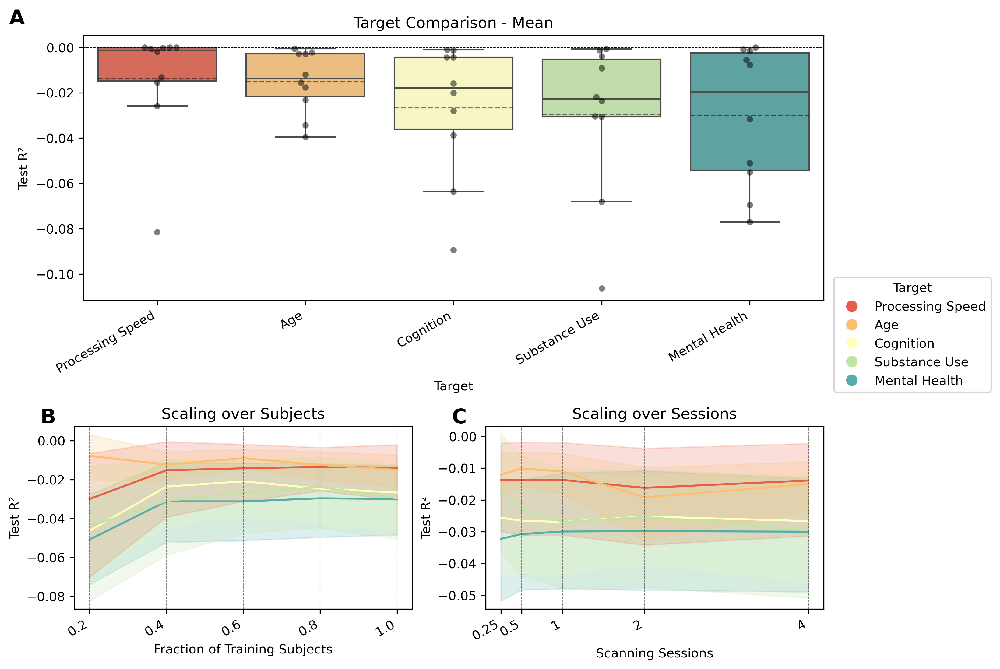

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


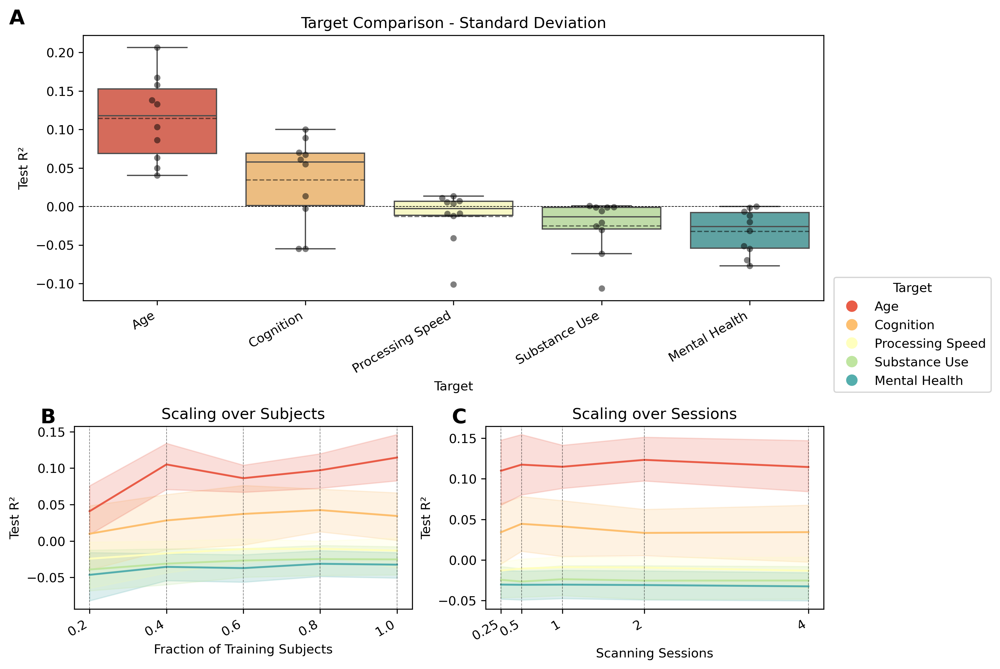

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


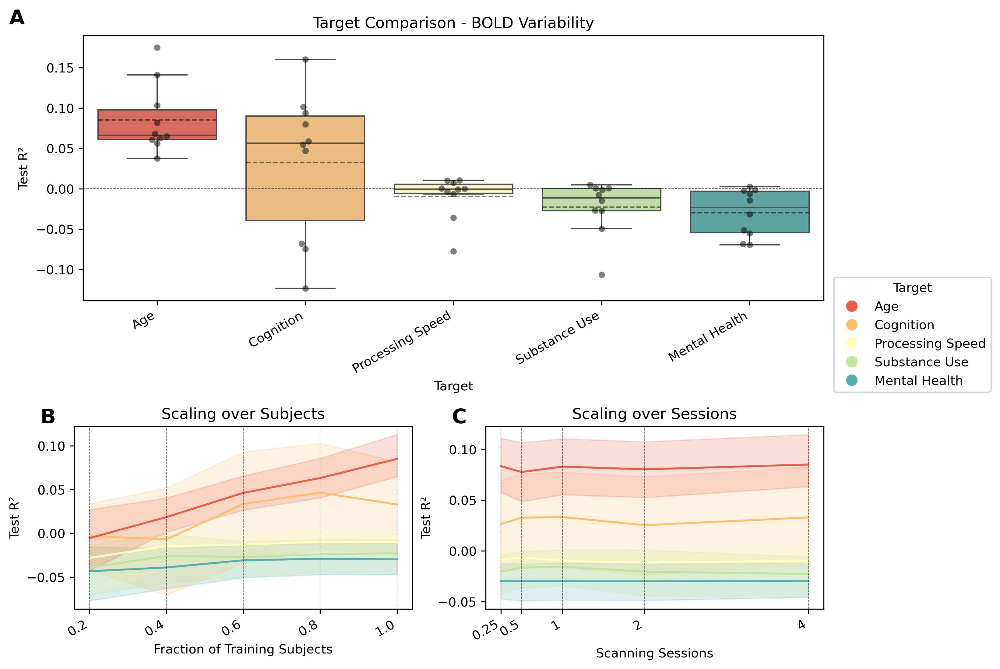

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


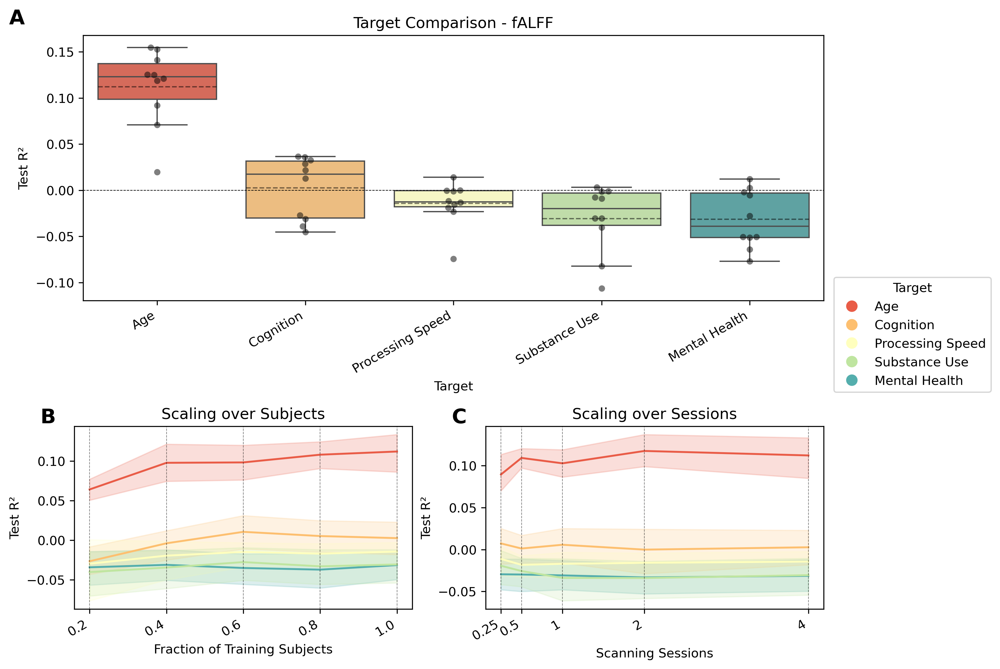

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


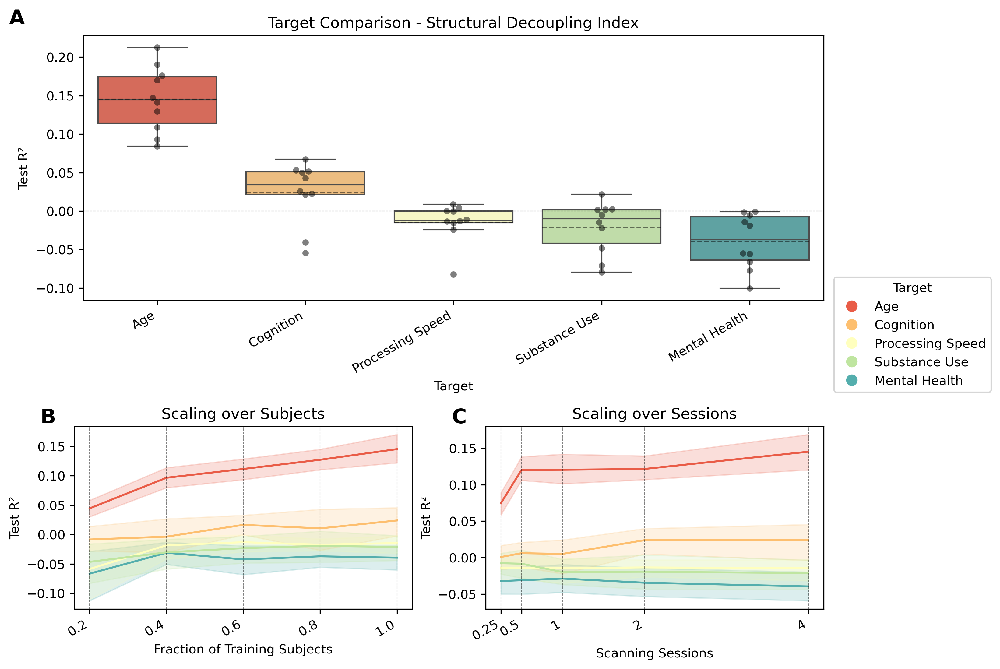

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


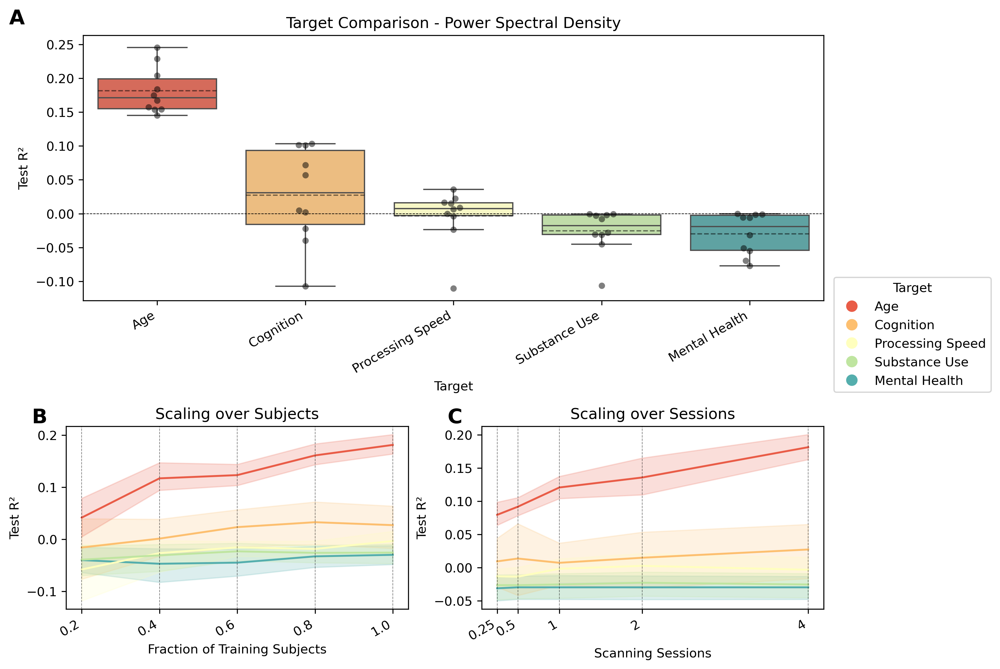

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


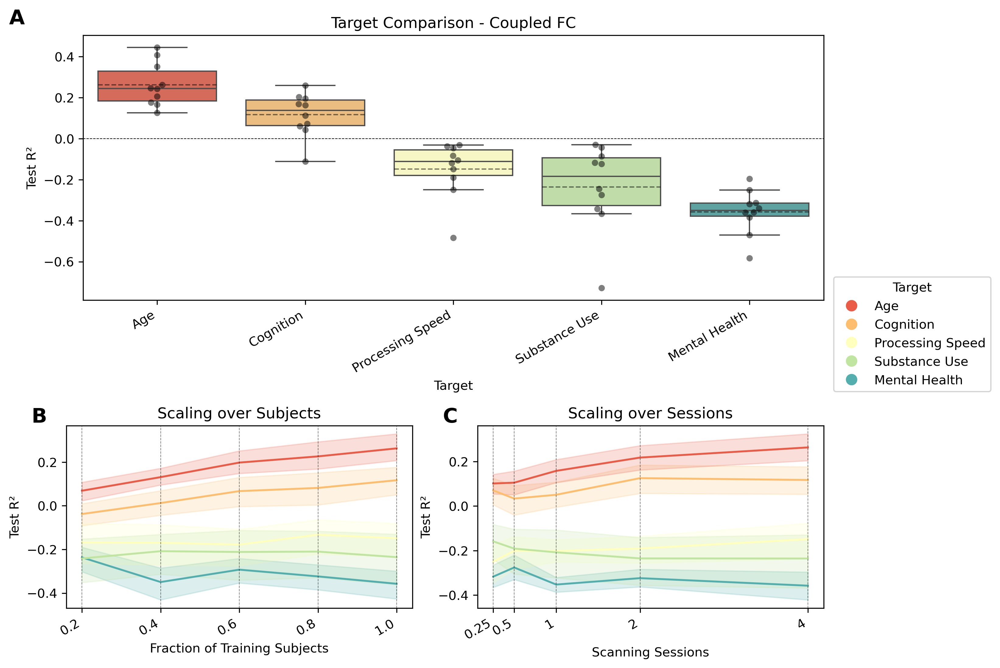

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


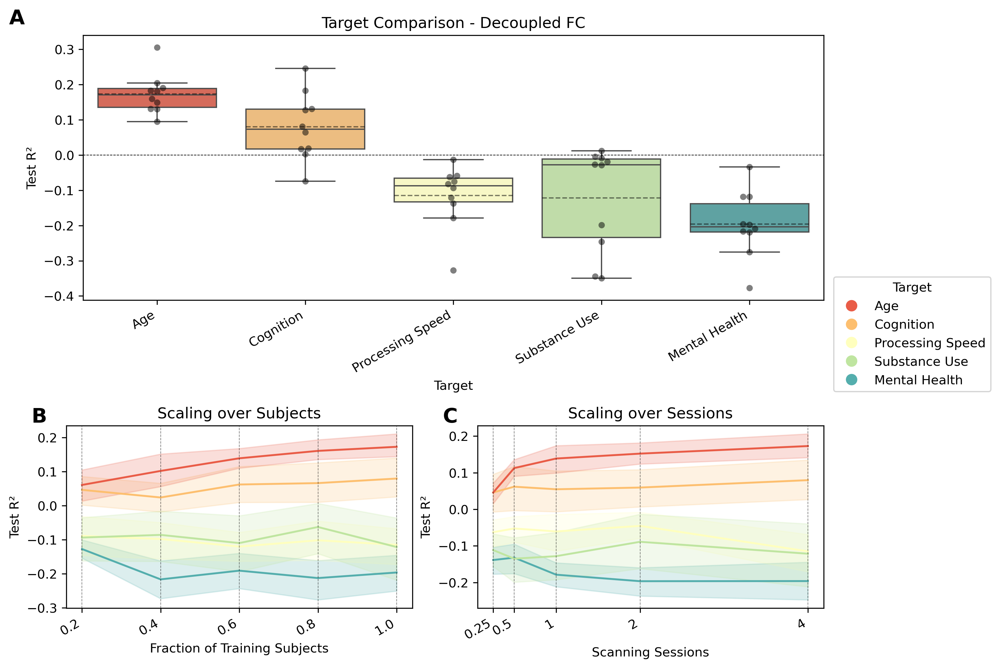

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


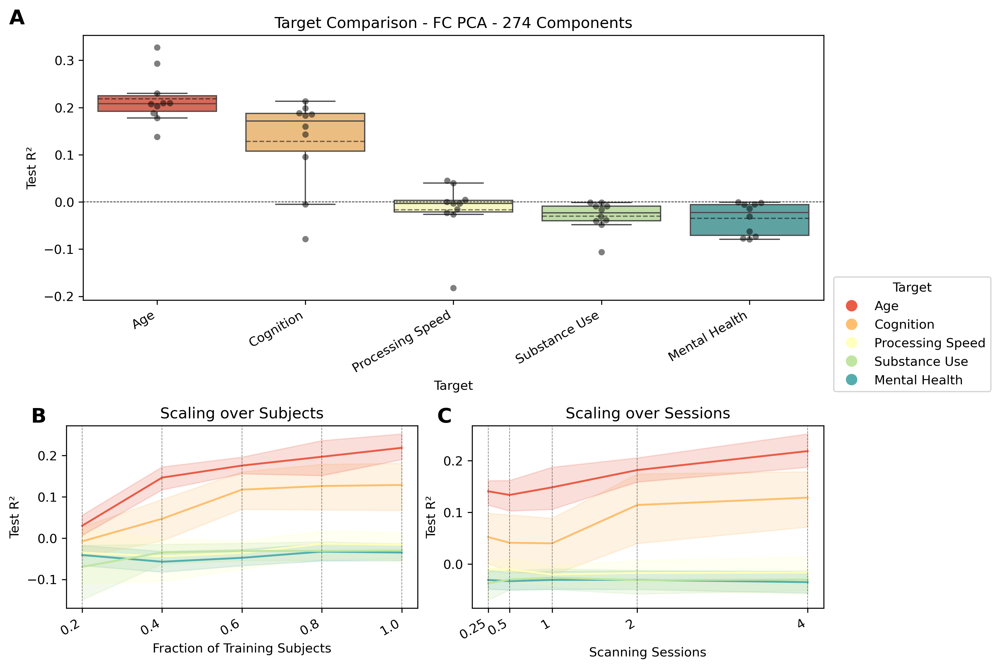

/tmp/ipykernel_504245/3047935132.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  top_axs.set_xticklabels(top_axs.get_xticklabels(), rotation=30, ha='right')


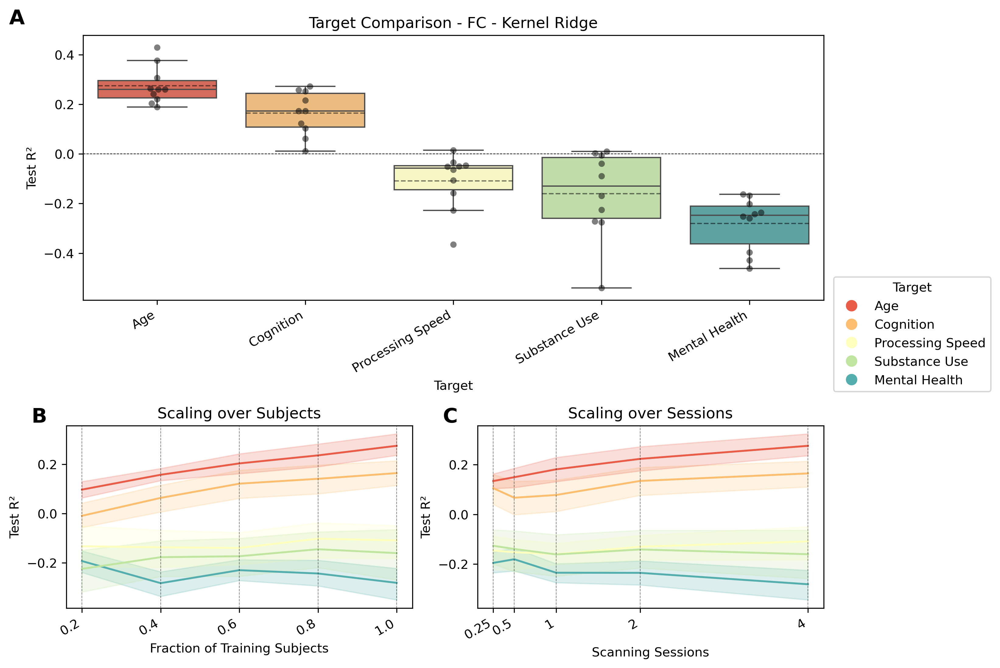

In [19]:
for feature in nice_feature_names:
    plot_target_comparison(df_nice, feature)

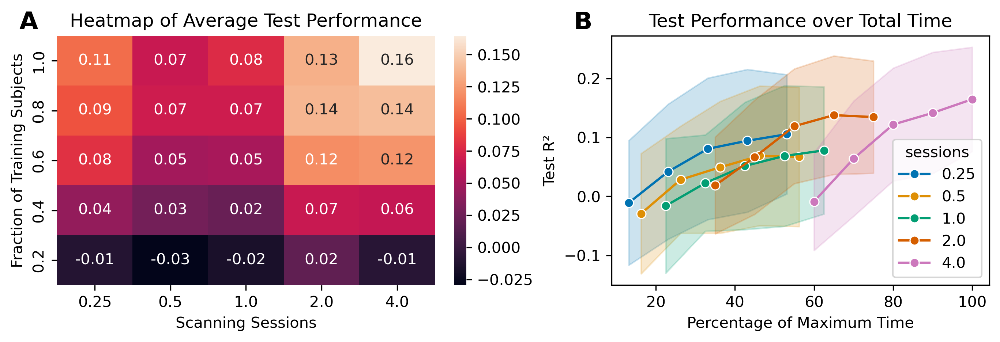

In [20]:
def plot_heatmap_lineplot(df, target = "Cognition", feature = "FC - Kernel Ridge"):
    df_heatmap = df[(df["target"] == target) & (df["feature"] == feature)].groupby(["fraction", "sessions"]).mean()
    df_lineplot = df[(df["target"] == target) & (df["feature"] == feature)].copy()
    df_lineplot["percent_time"] = (df_lineplot["fraction"] + df_lineplot["sessions"] / 4) / 2 * 100

    fig, axs = plt.subplots(1, 2, figsize=(9, 3), dpi=300, layout="constrained")

    if target == "Gender":
        measure = "accuracy"
    else:
        measure = "test_r2"

    sns.heatmap(df_heatmap[measure].unstack(), ax=axs[0], annot=True, fmt=".2f")

    # Invert y-axis of heatmap
    axs[0].invert_yaxis()
    # Rename x and y axes of heatmap
    axs[0].set_xlabel("Scanning Sessions")
    axs[0].set_ylabel("Fraction of Training Subjects")
    # Set title
    axs[0].set_title("Heatmap of Average Test Performance")

    sns.lineplot(data=df_lineplot, x="percent_time", y=measure, hue="sessions",
             marker="o", palette="colorblind", errorbar="sd", err_style="band",
             ax=axs[1])
    
    # Rename x and y axes of lineplot
    axs[1].set_xlabel("Percentage of Maximum Time")
    if target == "Gender":
        axs[1].set_ylabel("Test Accuracy")
    else:
        axs[1].set_ylabel("Test R²")
    # Set title
    axs[1].set_title("Test Performance over Total Time")

    # Add A,B labels
    axs[0].text(-0.1, 1.1, "A", transform=axs[0].transAxes, fontsize=16, fontweight='bold', va='top')
    axs[1].text(-0.1, 1.1, "B", transform=axs[1].transAxes, fontsize=16, fontweight='bold', va='top')

    # Overall title
    # fig.suptitle(f"Scaling - {target} - {feature}")

    plt.show()
plot_heatmap_lineplot(df_nice)

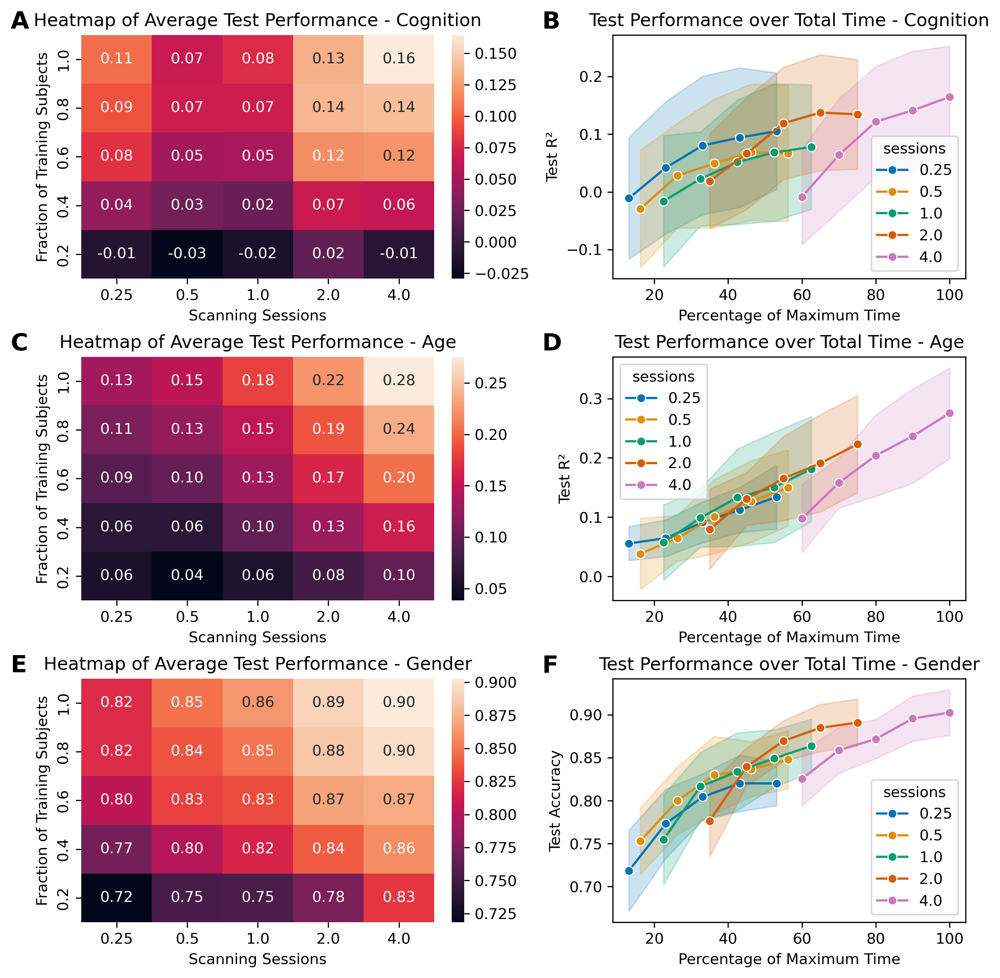

In [21]:
def plot_heatmap_lineplot_multipanel(df, df_gender=None, targets = ["Cognition", "Age", "Gender"], feature = "FC - Kernel Ridge"):

    fig, axs = plt.subplots(len(targets), 2, figsize=(9, 3*len(targets)), dpi=300, layout="constrained")
    # Letters
    letters = ["A", "B", "C", "D", "E", "F"]
    lettercounter = 0
    for i, target in enumerate(targets):
        if target == "Gender":
            df_plot = df_gender
        else:
            df_plot = df

        df_heatmap = df_plot[(df_plot["target"] == target) & (df_plot["feature"] == feature)].groupby(["fraction", "sessions"]).mean()
        df_lineplot = df_plot[(df_plot["target"] == target) & (df_plot["feature"] == feature)].copy()
        df_lineplot["percent_time"] = (df_lineplot["fraction"] + df_lineplot["sessions"] / 4) / 2 * 100

        if target == "Gender":
            measure = "accuracy"
        else:
            measure = "test_r2"

        sns.heatmap(df_heatmap[measure].unstack(), ax=axs[i, 0], annot=True, fmt=".2f")

        # Invert y-axis of heatmap
        axs[i, 0].invert_yaxis()
        # Rename x and y axes of heatmap
        axs[i, 0].set_xlabel("Scanning Sessions")
        axs[i, 0].set_ylabel("Fraction of Training Subjects")
        # Set title
        axs[i, 0].set_title(f"Heatmap of Average Test Performance - {target}")

        sns.lineplot(data=df_lineplot, x="percent_time", y=measure, hue="sessions",
                marker="o", palette="colorblind", errorbar="sd", err_style="band",
                ax=axs[i, 1])
        
        # Rename x and y axes of lineplot
        axs[i, 1].set_xlabel("Percentage of Maximum Time")
        if target == "Gender":
            axs[i, 1].set_ylabel("Test Accuracy")
        else:
            axs[i, 1].set_ylabel("Test R²")
        # Set title
        axs[i, 1].set_title(f"Test Performance over Total Time - {target}")

        # Add A,B labels
        axs[i, 0].text(-0.2, 1.1, letters[lettercounter], transform=axs[i, 0].transAxes, fontsize=16, fontweight='bold', va='top')
        axs[i, 1].text(-0.2, 1.1, letters[lettercounter+1], transform=axs[i, 1].transAxes, fontsize=16, fontweight='bold', va='top')

        lettercounter += 2


    plt.show()
plot_heatmap_lineplot_multipanel(df_nice, df_gender=df_nice_gender)

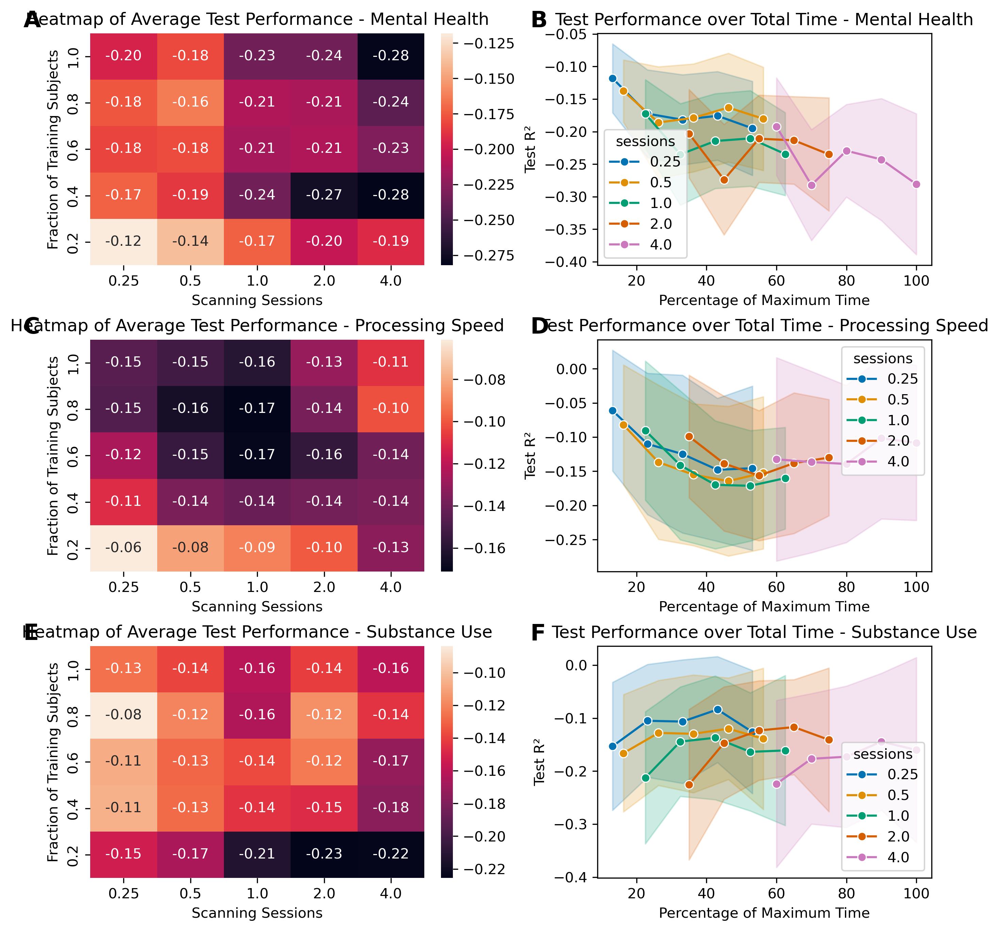

In [22]:
plot_heatmap_lineplot_multipanel(df_nice, targets=["Mental Health", "Processing Speed", "Substance Use"])

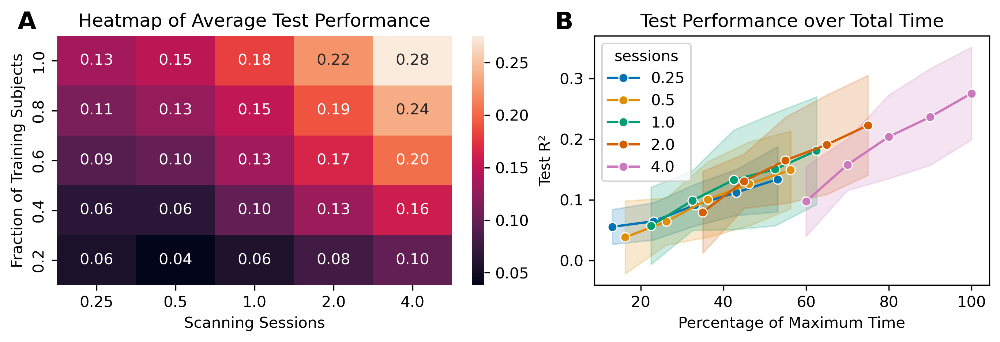

In [23]:
plot_heatmap_lineplot(df_nice, target="Age")

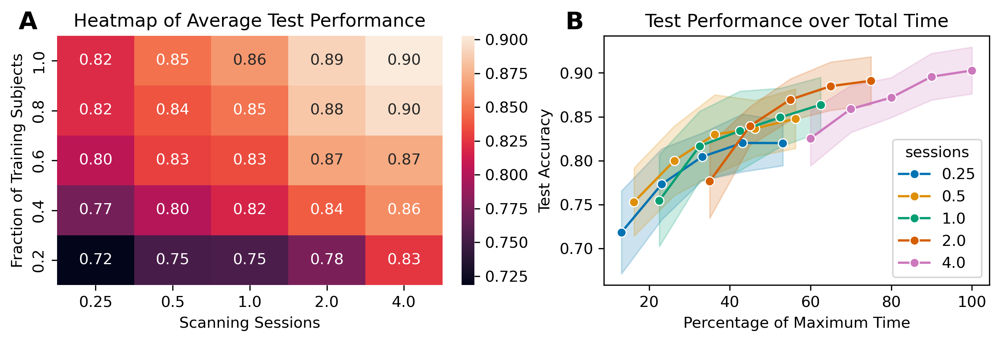

In [24]:
plot_heatmap_lineplot(df_nice_gender, target="Gender")